In [ ]:
import os
curDir = os.getcwd()
print(curDir)

/content


In [ ]:
!pip install spacy
!pip install pyLDAvis
!pip install --upgrade gensim

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.7 MB 2.4 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
    Preparing wheel metadata ... done
  Created wheel for pyLDAvis: filename=pyLDAvis-3.3.1-py2.py3-none-any.whl size=136898 sha256=8ee920bb4bae1b3ab7be101e7b4265c5713b4fec01639ca5f89eae194f765065
  Stored in directory: /root/.cache/pip/wheels/c9/21/f6/17bcf2667e8a68532ba2fbf6d5c72fdf4c7f7d9abfa4852d2f
Successfully built pyLDAvis
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 24.1 MB 5.4 MB/s 
  Attempting uninstall: gensim
    Found existing installation: gensim 3.6.0
    Uninstalling gensim-3.6.0:
      Successfull

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import string
import nltk

from nltk.stem.porter import PorterStemmer
porter_stemmer = PorterStemmer()

from nltk.stem import WordNetLemmatizer
wordnet_lemmatizer = WordNetLemmatizer()

In [ ]:
import re
import numpy as np
import pandas as pd
import nltk
import sklearn
from pprint import pprint
from sklearn.feature_extraction.text import CountVectorizer

# Gensim
import gensim
import gensim.corpora as corpora
from gensim.utils import simple_preprocess
from gensim.models.coherencemodel import CoherenceModel

# Plotting tools
import pyLDAvis
import pyLDAvis.gensim_models as plt_gensim # don't skip this
import matplotlib.pyplot as plt
%matplotlib inline

# Enable logging for gensim - optional
import logging
logging.basicConfig(format='%(asctime)s : %(levelname)s : %(message)s', level=logging.ERROR)

import warnings
warnings.filterwarnings("ignore",category=DeprecationWarning)

/usr/local/lib/python3.7/dist-packages/past/types/oldstr.py:5: DeprecationWarning: Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated since Python 3.3,and in 3.9 it will stop working
  from collections import Iterable
/usr/local/lib/python3.7/dist-packages/past/builtins/misc.py:4: DeprecationWarning: Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated since Python 3.3,and in 3.9 it will stop working
  from collections import Mapping


In [ ]:
import json
import nltk
import matplotlib.pyplot as plt
%matplotlib inline
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import TfidfTransformer
from nltk.probability import FreqDist
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from sklearn.metrics import confusion_matrix
import seaborn as sns
from sklearn.naive_bayes import MultinomialNB
from sklearn import metrics
from sklearn.model_selection import train_test_split
from matplotlib import cm
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score
from sklearn.naive_bayes import MultinomialNB
from wordcloud import WordCloud
import pickle
import re, string
import sys
import seaborn as sns
sns.set()
from sklearn.svm import SVC
from sklearn.pipeline import Pipeline
from sklearn.model_selection import cross_val_score
from sklearn.metrics import mean_squared_error, accuracy_score, f1_score, roc_auc_score
import pickle

In [ ]:
pd.set_option('display.max_rows', None)

In [ ]:
# Jupyter
# list file and directories
# dir_path = r'C:\UCI\SPRING\275 NLP\Group'
# res = os.listdir(dir_path)
# print(res)

#Colab
from google.colab import drive
drive.mount('/content/drive')
!ls "/content/drive/My Drive/UCI-SPRING/BANA275-NLP"

Mounted at /content/drive
 amazon_balanced.csv
 AMAZON.ipynb
 amazon_samples.csv
 BANA275_FINAL_PROJECT.gslides
 BANA275_HW1.gdoc
 BANA275_HW1.ipynb
 BANA275_Project.gdoc
 BANA275_project_preprocessing.ipynb
 BANA275_Proposal.gdoc
 combine_notebooks.ipynb
 emotions.csv
 Group_2_Wk1_Regular_Expression-1.ipynb
 Group_2_Wk1_Word_Cloud_v2.ipynb
 IMDB_Dataset.csv
 nlp_after_preprocess_v4.csv
"part of siyao's code.ipynb"
'Siyao_ WK9 - TopicModel.ipynb'
 Untitled0.ipynb
 Wk1_Regular_Expression_Siyao_Lu.ipynb
'Wk1-Word Cloud-Siyao Lu.ipynb'
 Wk2_Bag_of_Words_Classifiers.ipynb
'Wk3 - TFIDF and Ngrams.ipynb'
'Wk3 - TFIDF .ipynb'
'Wk 6 Sentiment Analysis.ipynb'
'Wk8 - Factorization and Embeddings (1).ipynb'
'Wk8 - Factorization and Embeddings.ipynb'
'WK9 - TopicModel.ipynb'


In [ ]:
# df = pd.read_csv("amazon_samples.csv")
from ast import literal_eval
df = pd.read_csv("/content/drive/My Drive/UCI-SPRING/BANA275-NLP/nlp_after_preprocess_v4.csv",converters={"clean_text": literal_eval})
df.shape

(499682, 4)

In [ ]:
del df['Unnamed: 0']

In [ ]:
# df = df[['overall','reviewerID','asin','reviewText','summary','unixReviewTime']]

In [ ]:
df.isnull().sum()

overall       0
target        0
clean_text    0
dtype: int64

In [ ]:
# df.dropna(inplace=True)
# df.isnull().sum()

overall           0
reviewerID        0
asin              0
reviewText        0
summary           0
unixReviewTime    0
dtype: int64

In [ ]:
# print(df.columns)
# df.shape

Index(['overall', 'reviewerID', 'asin', 'reviewText', 'summary',
       'unixReviewTime'],
      dtype='object')


(499682, 6)

In [ ]:
# df['combined_text'] = df['reviewText'] + ' ' + df['summary']

In [ ]:
# del df['reviewText']
# del df['summary']
df.head()

,overall,target,clean_text
0,1,0,"[purchase, two, first, become, unresponsive, s..."
1,1,0,"[stopped, work, exactly, week, two, ps4, work,..."
2,1,0,"[play, game, year, ago, love, figure, another,..."
3,1,0,"[get, thing, immediately, destroy, favorite, g..."
4,1,0,"[quality, product, top, notch, inherent, desig..."


In [ ]:
df['overall'].value_counts()

3    99960
2    99957
4    99947
1    99943
5    99875
Name: overall, dtype: int64

In [ ]:
# df['target']=[0  if x<=3 else 1 for x in df['overall']]

## Product ID & Overall

In [ ]:
# len(df['asin'].unique())

32330

In [ ]:
# df.groupby(['asin']).mean()

,overall,unixReviewTime
asin,,
0439342260,5.000000,1.431648e+09
0439381673,2.166667,1.440072e+09
0439542804,5.000000,1.360454e+09
043957448X,3.000000,1.469923e+09
0545036372,4.000000,1.397606e+09
0545112141,5.000000,1.404864e+09
0700026398,4.666667,1.424131e+09
0700026649,3.000000,1.386634e+09
0700026657,3.000000,1.415016e+09


In [ ]:
# df_asin_mean = df.groupby(['asin']).mean()
# df_great = df_asin_mean[df_asin_mean['overall']>=3]

In [ ]:
# df_great.shape

(27137, 2)

In [ ]:
# df_asin_mean['overall'].median()

4.125

C:\Users\18521\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


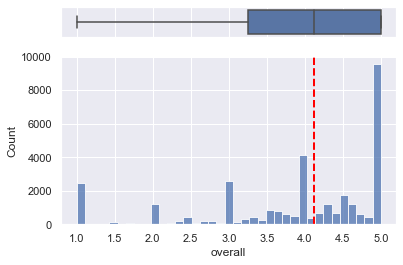

In [ ]:
# sns.set(style="darkgrid")
# f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, gridspec_kw={"height_ratios": (.15, .85)})

# sns.boxplot(df_asin_mean['overall'], ax=ax_box)
# sns.histplot(df_asin_mean['overall'], ax=ax_hist)
# ax_box.set(xlabel='')

# plt.axvline(x =df_asin_mean['overall'].median() ,color = "red",ls='--',lw =2)
# plt.show()

# Data Proprecessing

- Students' assignment

remove hashtags, symbols, mentions, URLs, digits, and punctuations.
remove those extra spaces
remove all single characters
stemming, Porter is the most commonly used stemmer, also one of the most gentle stemmers, there are many words we missed their original meaning after taking stemming and ended up lowering the accuracy. Therefore, we decided to not add stemming for the text cleansing part.

Regex : Removing Flight Number, Emoji, Hashtags, Twitter Username, Text Punctuations, and Symbols
Html Parser + Lowercase
Stopwords Extension (>500 words),
Spacy Tokens: Remove Adjective and Conjunction
Stemmer + Lemmatizer

- Research

Removing punctuations like . , ! $( ) * % @

Removing URLs

Removing Stop words

Lower casing

Tokenization

Stemming

Lemmatization

https://www.analyticsvidhya.com/blog/2021/06/text-preprocessing-in-nlp-with-python-codes/

## remove punctuations

In [ ]:
string.punctuation

'!"#$%&\'()*+,-./:;<=>?@[\\]^_`{|}~'

In [ ]:
def remove_punctuation(text):
    punctuationfree="".join([i for i in text if i not in string.punctuation])
    return punctuationfree

In [ ]:
df['clean_text']= df['reviewText'].apply(lambda x:remove_punctuation(x))
df.head()

,overall,reviewerID,asin,reviewText,summary,unixReviewTime,clean_text
0,5,A1HJG3D1PIRWNV,B000U5W3IW,Had a wonderful time and needed to do it twice...,Professor Layton's Curoius Village,1281052800,Had a wonderful time and needed to do it twice...
1,4,ASGOMH6QU3XVT,B000047GEI,I want to play this casset because i h...,Pokemon Yellow,1062288000,I want to play this casset because i h...
2,1,A7A7CA88APPBR,B015WKY3IM,Controller was labeled refurbished but was not...,Broken controller upon delivery,1503273600,Controller was labeled refurbished but was not...
3,3,A3HP76CUIPWJRM,B0053BG122,This was a fun game that encouraged all of our...,Family fun,1469750400,This was a fun game that encouraged all of our...
4,5,AUDQHRL3C52AJ,B00D6PTMSW,Great item.,Five Stars,1415923200,Great item


In [ ]:
df['clean_text'][1] # don't remove \n

'I  want  to  play  this  casset  because  i  havent  play  this  game  and  I  think  it  will  be  fantastic\n  ThANKS  ALEX'

## lower the text

In [ ]:
df['lower_text']= df['clean_text'].apply(lambda x: x.lower())
df.head()

,overall,reviewerID,asin,reviewText,summary,unixReviewTime,clean_text,lower_text
0,5,A1HJG3D1PIRWNV,B000U5W3IW,Had a wonderful time and needed to do it twice...,Professor Layton's Curoius Village,1281052800,Had a wonderful time and needed to do it twice...,had a wonderful time and needed to do it twice...
1,4,ASGOMH6QU3XVT,B000047GEI,I want to play this casset because i h...,Pokemon Yellow,1062288000,I want to play this casset because i h...,i want to play this casset because i h...
2,1,A7A7CA88APPBR,B015WKY3IM,Controller was labeled refurbished but was not...,Broken controller upon delivery,1503273600,Controller was labeled refurbished but was not...,controller was labeled refurbished but was not...
3,3,A3HP76CUIPWJRM,B0053BG122,This was a fun game that encouraged all of our...,Family fun,1469750400,This was a fun game that encouraged all of our...,this was a fun game that encouraged all of our...
4,5,AUDQHRL3C52AJ,B00D6PTMSW,Great item.,Five Stars,1415923200,Great item,great item


In [ ]:
df['lower_text'][1] # don't remove \n

'i  want  to  play  this  casset  because  i  havent  play  this  game  and  i  think  it  will  be  fantastic\n  thanks  alex'

## tokenization

In [ ]:
def tokenization(text):
    tokens = nltk.word_tokenize(text)
    return tokens

In [ ]:
df['token_text']= df['lower_text'].apply(lambda x: tokenization(x))
df.head()

,overall,reviewerID,asin,reviewText,summary,unixReviewTime,clean_text,lower_text,token_text,nostopwords_text
0,5,A1HJG3D1PIRWNV,B000U5W3IW,Had a wonderful time and needed to do it twice...,Professor Layton's Curoius Village,1281052800,Had a wonderful time and needed to do it twice...,had a wonderful time and needed to do it twice...,"[had, a, wonderful, time, and, needed, to, do,...",[had a wonderful time and needed to do it twic...
1,4,ASGOMH6QU3XVT,B000047GEI,I want to play this casset because i h...,Pokemon Yellow,1062288000,I want to play this casset because i h...,i want to play this casset because i h...,"[i, want, to, play, this, casset, because, i, ...",[i want to play this casset because i ...
2,1,A7A7CA88APPBR,B015WKY3IM,Controller was labeled refurbished but was not...,Broken controller upon delivery,1503273600,Controller was labeled refurbished but was not...,controller was labeled refurbished but was not...,"[controller, was, labeled, refurbished, but, w...",[controller was labeled refurbished but was no...
3,3,A3HP76CUIPWJRM,B0053BG122,This was a fun game that encouraged all of our...,Family fun,1469750400,This was a fun game that encouraged all of our...,this was a fun game that encouraged all of our...,"[this, was, a, fun, game, that, encouraged, al...",[this was a fun game that encouraged all of ou...
4,5,AUDQHRL3C52AJ,B00D6PTMSW,Great item.,Five Stars,1415923200,Great item,great item,"[great, item]",[great item]


In [ ]:
df['token_text'][1] # remove \n

['i',
 'want',
 'to',
 'play',
 'this',
 'casset',
 'because',
 'i',
 'havent',
 'play',
 'this',
 'game',
 'and',
 'i',
 'think',
 'it',
 'will',
 'be',
 'fantastic',
 'thanks',
 'alex']

## stop word removal

In [ ]:
stopwords = nltk.corpus.stopwords.words('english')
print(len(stopwords))
stopwords

179


['i',
 'me',
 'my',
 'myself',
 'we',
 'our',
 'ours',
 'ourselves',
 'you',
 "you're",
 "you've",
 "you'll",
 "you'd",
 'your',
 'yours',
 'yourself',
 'yourselves',
 'he',
 'him',
 'his',
 'himself',
 'she',
 "she's",
 'her',
 'hers',
 'herself',
 'it',
 "it's",
 'its',
 'itself',
 'they',
 'them',
 'their',
 'theirs',
 'themselves',
 'what',
 'which',
 'who',
 'whom',
 'this',
 'that',
 "that'll",
 'these',
 'those',
 'am',
 'is',
 'are',
 'was',
 'were',
 'be',
 'been',
 'being',
 'have',
 'has',
 'had',
 'having',
 'do',
 'does',
 'did',
 'doing',
 'a',
 'an',
 'the',
 'and',
 'but',
 'if',
 'or',
 'because',
 'as',
 'until',
 'while',
 'of',
 'at',
 'by',
 'for',
 'with',
 'about',
 'against',
 'between',
 'into',
 'through',
 'during',
 'before',
 'after',
 'above',
 'below',
 'to',
 'from',
 'up',
 'down',
 'in',
 'out',
 'on',
 'off',
 'over',
 'under',
 'again',
 'further',
 'then',
 'once',
 'here',
 'there',
 'when',
 'where',
 'why',
 'how',
 'all',
 'any',
 'both',
 'each

In [ ]:
def remove_stopwords(text):
    output= [i for i in text if i not in stopwords]
    return output

In [ ]:
df['nostopwords_text']= df['token_text'].apply(lambda x:remove_stopwords(x))
df.head()

,overall,reviewerID,asin,reviewText,summary,unixReviewTime,clean_text,lower_text,token_text,nostopwords_text
0,5,A1HJG3D1PIRWNV,B000U5W3IW,Had a wonderful time and needed to do it twice...,Professor Layton's Curoius Village,1281052800,Had a wonderful time and needed to do it twice...,had a wonderful time and needed to do it twice...,"[had, a, wonderful, time, and, needed, to, do,...","[wonderful, time, needed, twice, bang, points,..."
1,4,ASGOMH6QU3XVT,B000047GEI,I want to play this casset because i h...,Pokemon Yellow,1062288000,I want to play this casset because i h...,i want to play this casset because i h...,"[i, want, to, play, this, casset, because, i, ...","[want, play, casset, havent, play, game, think..."
2,1,A7A7CA88APPBR,B015WKY3IM,Controller was labeled refurbished but was not...,Broken controller upon delivery,1503273600,Controller was labeled refurbished but was not...,controller was labeled refurbished but was not...,"[controller, was, labeled, refurbished, but, w...","[controller, labeled, refurbished, sends, rand..."
3,3,A3HP76CUIPWJRM,B0053BG122,This was a fun game that encouraged all of our...,Family fun,1469750400,This was a fun game that encouraged all of our...,this was a fun game that encouraged all of our...,"[this, was, a, fun, game, that, encouraged, al...","[fun, game, encouraged, family, members, dance..."
4,5,AUDQHRL3C52AJ,B00D6PTMSW,Great item.,Five Stars,1415923200,Great item,great item,"[great, item]","[great, item]"


In [ ]:
df['nostopwords_text'][1]

['want',
 'play',
 'casset',
 'havent',
 'play',
 'game',
 'think',
 'fantastic',
 'thanks',
 'alex']

## stemming or lemmatization

It is also known as the text standardization step where the words are stemmed or diminished to their root/base form.  For example, words like ‘programmer’, ‘programming, ‘program’ will be stemmed to ‘program’.

But the disadvantage of stemming is that it stems the words such that its root form loses the meaning or it is not diminished to a proper English word.

In [ ]:
def stemming(text):
    stem_text = [porter_stemmer.stem(word) for word in text]
    return stem_text

In [ ]:
df['stem_text']=df['nostopwords_text'].apply(lambda x: stemming(x))

In [ ]:
df['stem_text'][1]

['want',
 'play',
 'casset',
 'havent',
 'play',
 'game',
 'think',
 'fantast',
 'thank',
 'alex']

It stems the word but makes sure that it does not lose its meaning.  Lemmatization has a pre-defined dictionary that stores the context of words and checks the word in the dictionary while diminishing.

In [ ]:
def lemmatizer(text):
    lemm_text = [wordnet_lemmatizer.lemmatize(word) for word in text]
    return lemm_text

In [ ]:
df['lemma_text']=df['nostopwords_text'].apply(lambda x: lemmatizer(x))

In [ ]:
df['lemma_text'][1]

['want',
 'play',
 'casset',
 'havent',
 'play',
 'game',
 'think',
 'fantastic',
 'thanks',
 'alex']

## remove nt

In [ ]:
nt_list = ['havent', 'hadnt', 'hasnt', 'arent','isnt', 'wasnt', 'amnt', 'couldnt', 'cannt', 'shant', 'shouldnt', 'wouldnt', 'wont']

In [ ]:
def remove_nt(text):
    output= [i for i in text if i not in nt_list]
    return output

df['final_text']= df['lemma_text'].apply(lambda x:remove_nt(x))
df.head()

,overall,reviewerID,asin,reviewText,summary,unixReviewTime,clean_text,lower_text,token_text,nostopwords_text,stem_text,lemma_text,final_text
0,5,A1HJG3D1PIRWNV,B000U5W3IW,Had a wonderful time and needed to do it twice...,Professor Layton's Curoius Village,1281052800,Had a wonderful time and needed to do it twice...,had a wonderful time and needed to do it twice...,"[had, a, wonderful, time, and, needed, to, do,...","[wonderful, time, needed, twice, bang, points,...","[wonder, time, need, twice, bang, point, wonde...","[wonderful, time, needed, twice, bang, point, ...","[wonderful, time, needed, twice, bang, point, ..."
1,4,ASGOMH6QU3XVT,B000047GEI,I want to play this casset because i h...,Pokemon Yellow,1062288000,I want to play this casset because i h...,i want to play this casset because i h...,"[i, want, to, play, this, casset, because, i, ...","[want, play, casset, havent, play, game, think...","[want, play, casset, havent, play, game, think...","[want, play, casset, havent, play, game, think...","[want, play, casset, play, game, think, fantas..."
2,1,A7A7CA88APPBR,B015WKY3IM,Controller was labeled refurbished but was not...,Broken controller upon delivery,1503273600,Controller was labeled refurbished but was not...,controller was labeled refurbished but was not...,"[controller, was, labeled, refurbished, but, w...","[controller, labeled, refurbished, sends, rand...","[control, label, refurbish, send, random, sign...","[controller, labeled, refurbished, sends, rand...","[controller, labeled, refurbished, sends, rand..."
3,3,A3HP76CUIPWJRM,B0053BG122,This was a fun game that encouraged all of our...,Family fun,1469750400,This was a fun game that encouraged all of our...,this was a fun game that encouraged all of our...,"[this, was, a, fun, game, that, encouraged, al...","[fun, game, encouraged, family, members, dance...","[fun, game, encourag, famili, member, danc, ex...","[fun, game, encouraged, family, member, dance,...","[fun, game, encouraged, family, member, dance,..."
4,5,AUDQHRL3C52AJ,B00D6PTMSW,Great item.,Five Stars,1415923200,Great item,great item,"[great, item]","[great, item]","[great, item]","[great, item]","[great, item]"


In [ ]:
df['final_text'][1]

['want',
 'play',
 'casset',
 'play',
 'game',
 'think',
 'fantastic',
 'thanks',
 'alex']

In [ ]:
# nltk.download('averaged_perceptron_tagger')
from nltk import PerceptronTagger
tagger.PerceptronTagger()

In [ ]:
tagger.tag(df['final_text'][1])

[('want', 'JJ'),
 ('play', 'NN'),
 ('casset', 'VBN'),
 ('play', 'VBP'),
 ('game', 'NN'),
 ('think', 'VBP'),
 ('fantastic', 'JJ'),
 ('thanks', 'NNS'),
 ('alex', 'VBP')]

## Conclusion

In [ ]:
def remove_punctuation(text):
    punctuationfree="".join([i for i in text if i not in string.punctuation])
    return punctuationfree

In [ ]:
def tokenization(text):
    tokens = nltk.word_tokenize(text)
    return tokens

In [ ]:
stopwords = nltk.corpus.stopwords.words('english')
def remove_stopwords(text):
    output= [i for i in text if i not in stopwords]
    return output

In [ ]:
def stemming(text):
    stem_text = [porter_stemmer.stem(word) for word in text]
    return stem_text

In [ ]:
def lemmatizer(text):
    lemm_text = [wordnet_lemmatizer.lemmatize(word) for word in text]
    return lemm_text

In [ ]:
nt_list = ['havent', 'hadnt', 'hasnt', 'arent','isnt', 'wasnt', 'amnt', 'couldnt', 'cannt', 'shant', 'shouldnt', 'wouldnt', 'wont']
def remove_nt(text):
    output= [i for i in text if i not in nt_list]
    return output

In [ ]:
df['clean_text']= df['reviewText'].apply(lambda x:remove_punctuation(x))
print("remove punctuations, over")
df['clean_text']= df['clean_text'].apply(lambda x: x.lower())
print("lower the text, over")
df['clean_text']= df['clean_text'].apply(lambda x: tokenization(x))
print("tokenization step, over")
df['clean_text']= df['clean_text'].apply(lambda x:remove_stopwords(x))
print("stop word removal, over")
df['clean_text']=df['clean_text'].apply(lambda x: lemmatizer(x))
print("lemmatization step, over")
df['clean_text']= df['clean_text'].apply(lambda x:remove_nt(x))
print("Completed")

remove punctuations, over
lower the text, over
tokenization step, over
stop word removal, over
lemmatization step, over
Completed


# Professor's ways

In [ ]:
!pip install spacy
!pip install pyLDAvis
!pip install --upgrade gensim

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.7 MB 7.3 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
    Preparing wheel metadata ... done
  Created wheel for pyLDAvis: filename=pyLDAvis-3.3.1-py2.py3-none-any.whl size=136898 sha256=8a84b04566841d9bc2540c961733e944cfc25350b6739333625bedc9b0bb3fd3
  Stored in directory: /root/.cache/pip/wheels/c9/21/f6/17bcf2667e8a68532ba2fbf6d5c72fdf4c7f7d9abfa4852d2f
Successfully built pyLDAvis
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 24.1 MB 1.5 MB/s 
  Attempting uninstall: gensim
    Found existing installation: gensim 3.6.0
    Uninstalling gensim-3.6.0:
      Successfull

In [ ]:
import re
import numpy as np
import pandas as pd
import nltk
import sklearn
from pprint import pprint
from sklearn.feature_extraction.text import CountVectorizer

# Gensim
import gensim
import gensim.corpora as corpora
from gensim.utils import simple_preprocess
from gensim.models import CoherenceModel

# spacy for lemmatization
import spacy

# Plotting tools
import pyLDAvis
import pyLDAvis.gensim_models as plt_gensim # don't skip this
import matplotlib.pyplot as plt
%matplotlib inline

# Enable logging for gensim - optional
import logging
logging.basicConfig(format='%(asctime)s : %(levelname)s : %(message)s', level=logging.ERROR)

import warnings
warnings.filterwarnings("ignore",category=DeprecationWarning)

nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

In [ ]:
df['new_text'] = df['reviewText'].values.tolist()
# Remove new line characters
df['new_text'] = [re.sub('\s+', ' ', sent) for sent in df['new_text']]
# Remove distracting single quotes
df['new_text'] = [re.sub("\'", "", sent) for sent in df['new_text']]
df['new_text'][1]

'I want to play this casset because i haven`t play this game and I think it will be fantastic. ThANK`S ALEX'

In [ ]:
df['lower_text']= df['new_text'].apply(lambda x: x.lower())
df['lower_text'][1]

'i want to play this casset because i haven`t play this game and i think it will be fantastic. thank`s alex'

In [ ]:
def sent_to_words(sentences):
    for sentence in sentences:
        yield(gensim.utils.simple_preprocess(str(sentence), deacc=True))  # deacc=True removes punctuations

df['sent_to_words'] = list(sent_to_words(df['lower_text']))

In [ ]:
df['sent_to_words'][1]

['want',
 'to',
 'play',
 'this',
 'casset',
 'because',
 'haven',
 'play',
 'this',
 'game',
 'and',
 'think',
 'it',
 'will',
 'be',
 'fantastic',
 'thank',
 'alex']

In [ ]:
# Build the bigram and trigram models
bigram = gensim.models.Phrases(df['sent_to_words'], min_count=5, threshold=20) # higher threshold fewer phrases.
trigram = gensim.models.Phrases(bigram[df['sent_to_words']], threshold=20)  

# Faster way to get a sentence clubbed as a trigram/bigram
bigram_mod = gensim.models.phrases.Phraser(bigram)
trigram_mod = gensim.models.phrases.Phraser(trigram)

/usr/local/lib/python3.7/dist-packages/gensim/models/phrases.py:598: UserWarning: For a faster implementation, use the gensim.models.phrases.Phraser class
  start_token, in_between = word, []  # treat word as both end of a phrase AND beginning of another


In [ ]:
# See trigram example
print(trigram_mod[bigram_mod[df['sent_to_words'][30]]])

['thought', 'was', 'ordering', 'game', 'stop', 'or', 'nintendo', 'gift_card', 'this', 'card', 'from', 'what', 'im', 'reading', 'cant', 'really', 'be', 'used', 'for', 'anything', 'order', 'alot', 'on', 'amazon', 'and', 'think', 'should', 'be', 'allowed', 'to', 'swap', 'it', 'for', 'the', 'gift_card', 'wanted', 'since', 'its', 'never', 'been', 'used', 'it', 'cant', 'be', 'used', 'for', 'any', 'nintendo']


In [ ]:
# stopwords removal
stopwords = nltk.corpus.stopwords.words('english')
# stopwords.extend(['game', 'subject', 're', 'edu', 'use'])
def remove_stopwords(text):
    output= [i for i in text if i not in stopwords]
    return output

In [ ]:
df['nostopwords_text']= df['sent_to_words'].apply(lambda x:remove_stopwords(x))
df.head()

,overall,reviewerID,asin,reviewText,summary,unixReviewTime,new_text,lower_text,sent_to_words,nostopwords_text
0,5,A1HJG3D1PIRWNV,B000U5W3IW,Had a wonderful time and needed to do it twice...,Professor Layton's Curoius Village,1281052800,Had a wonderful time and needed to do it twice...,had a wonderful time and needed to do it twice...,"[had, wonderful, time, and, needed, to, do, it...","[wonderful, time, needed, twice, bang, points,..."
1,4,ASGOMH6QU3XVT,B000047GEI,I want to play this casset because i h...,Pokemon Yellow,1062288000,I want to play this casset because i haven`t p...,i want to play this casset because i haven`t p...,"[want, to, play, this, casset, because, haven,...","[want, play, casset, play, game, think, fantas..."
2,1,A7A7CA88APPBR,B015WKY3IM,Controller was labeled refurbished but was not...,Broken controller upon delivery,1503273600,Controller was labeled refurbished but was not...,controller was labeled refurbished but was not...,"[controller, was, labeled, refurbished, but, w...","[controller, labeled, refurbished, sends, rand..."
3,3,A3HP76CUIPWJRM,B0053BG122,This was a fun game that encouraged all of our...,Family fun,1469750400,This was a fun game that encouraged all of our...,this was a fun game that encouraged all of our...,"[this, was, fun, game, that, encouraged, all, ...","[fun, game, encouraged, family, members, dance..."
4,5,AUDQHRL3C52AJ,B00D6PTMSW,Great item.,Five Stars,1415923200,Great item.,great item.,"[great, item]","[great, item]"


In [ ]:
# form Bigrams
df['make_bigrams']= df['nostopwords_text'].apply(lambda x:bigram_mod[x])
df.head()

,overall,reviewerID,asin,reviewText,summary,unixReviewTime,new_text,lower_text,sent_to_words,nostopwords_text,make_bigrams
0,5,A1HJG3D1PIRWNV,B000U5W3IW,Had a wonderful time and needed to do it twice...,Professor Layton's Curoius Village,1281052800,Had a wonderful time and needed to do it twice...,had a wonderful time and needed to do it twice...,"[had, wonderful, time, and, needed, to, do, it...","[wonderful, time, needed, twice, bang, points,...","[wonderful, time, needed, twice, bang, points,..."
1,4,ASGOMH6QU3XVT,B000047GEI,I want to play this casset because i h...,Pokemon Yellow,1062288000,I want to play this casset because i haven`t p...,i want to play this casset because i haven`t p...,"[want, to, play, this, casset, because, haven,...","[want, play, casset, play, game, think, fantas...","[want, play, casset, play, game, think, fantas..."
2,1,A7A7CA88APPBR,B015WKY3IM,Controller was labeled refurbished but was not...,Broken controller upon delivery,1503273600,Controller was labeled refurbished but was not...,controller was labeled refurbished but was not...,"[controller, was, labeled, refurbished, but, w...","[controller, labeled, refurbished, sends, rand...","[controller, labeled, refurbished, sends, rand..."
3,3,A3HP76CUIPWJRM,B0053BG122,This was a fun game that encouraged all of our...,Family fun,1469750400,This was a fun game that encouraged all of our...,this was a fun game that encouraged all of our...,"[this, was, fun, game, that, encouraged, all, ...","[fun, game, encouraged, family, members, dance...","[fun, game, encouraged, family_members, dance,..."
4,5,AUDQHRL3C52AJ,B00D6PTMSW,Great item.,Five Stars,1415923200,Great item.,great item.,"[great, item]","[great, item]","[great, item]"


In [ ]:
# Form Trigram
df['make_trigrams']= df['nostopwords_text'].apply(lambda x:trigram_mod[bigram_mod[x]])
df.head()

,overall,reviewerID,asin,reviewText,summary,unixReviewTime,new_text,lower_text,sent_to_words,nostopwords_text,make_bigrams,make_trigrams,lemma_text_bigrams
0,5,A1HJG3D1PIRWNV,B000U5W3IW,Had a wonderful time and needed to do it twice...,Professor Layton's Curoius Village,1281052800,Had a wonderful time and needed to do it twice...,had a wonderful time and needed to do it twice...,"[had, wonderful, time, and, needed, to, do, it...","[wonderful, time, needed, twice, bang, points,...","[wonderful, time, needed, twice, bang, points,...","[wonderful, time, needed, twice, bang, points,...","[wonderful, time, need, twice, point, wonderfu..."
1,4,ASGOMH6QU3XVT,B000047GEI,I want to play this casset because i h...,Pokemon Yellow,1062288000,I want to play this casset because i haven`t p...,i want to play this casset because i haven`t p...,"[want, to, play, this, casset, because, haven,...","[want, play, casset, play, game, think, fantas...","[want, play, casset, play, game, think, fantas...","[want, play, casset, play, game, think, fantas...","[want, play, casset, play, game, think, thank]"
2,1,A7A7CA88APPBR,B015WKY3IM,Controller was labeled refurbished but was not...,Broken controller upon delivery,1503273600,Controller was labeled refurbished but was not...,controller was labeled refurbished but was not...,"[controller, was, labeled, refurbished, but, w...","[controller, labeled, refurbished, sends, rand...","[controller, labeled, refurbished, sends, rand...","[controller, labeled, refurbished, sends, rand...","[label, refurbish, send, random, signal, remot..."
3,3,A3HP76CUIPWJRM,B0053BG122,This was a fun game that encouraged all of our...,Family fun,1469750400,This was a fun game that encouraged all of our...,this was a fun game that encouraged all of our...,"[this, was, fun, game, that, encouraged, all, ...","[fun, game, encouraged, family, members, dance...","[fun, game, encouraged, family_members, dance,...","[fun, game, encouraged, family_members, dance,...","[game, encourage, dance, extra, dancing, help,..."
4,5,AUDQHRL3C52AJ,B00D6PTMSW,Great item.,Five Stars,1415923200,Great item.,great item.,"[great, item]","[great, item]","[great, item]","[great, item]","[great, item]"


In [ ]:
# !pip3 install https://github.com/explosion/spacy-models/releases/download/en_core_web_sm-2.2.0/en_core_web_sm-2.2.0.tar.gz

In [ ]:
def lemmatization(texts, allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV']):
    """https://spacy.io/api/annotation"""
    texts_out = []
    for sent in texts:
        doc = nlp(" ".join(sent)) 
        texts_out.append([token.lemma_ for token in doc if token.pos_ in allowed_postags])
    return texts_out

In [ ]:
# bigrams lemmatization
nlp = spacy.load('en_core_web_sm', disable=['parser', 'ner'])
bigrams_list = df['make_bigrams'].tolist()
lemma_text_bigrams=lemmatization(bigrams_list, allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV'])

In [ ]:
df['lemma_text_bigrams'] = 0
for i in range(0,len(lemma_text_bigrams)):
  df['lemma_text_bigrams'][i] = lemma_text_bigrams[i]

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


In [ ]:
# trigrmas lemmatization
trigrams_list = df['make_trigrams'].tolist()
print('tolist over')
lemma_text_trigrams=lemmatization(trigrams_list, allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV'])

tolist over


In [ ]:
df['lemma_text_trigrams'] = 0
for i in range(0,len(lemma_text_trigrams)):
  df['lemma_text_trigrams'][i] = lemma_text_trigrams[i]

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


### wordcloud

In [ ]:
df['to_string_trigrams'] = 0
for i in range(0,len(lemma_text_trigrams)):
  df['to_string_trigrams'][i] = " ".join(lemma_text_trigrams[i])

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


In [ ]:
df['to_string_trigrams'][10]

'awesome love great seller buy'

In [ ]:
text = " ".join(map(str, df.to_string_trigrams))

In [ ]:
print ("There are {} words in the combination of all review.".format(len(text)))

There are 37450451 words in the combination of all review.


In [ ]:
from os import path
from PIL import Image
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
from nltk import FreqDist

import matplotlib.pyplot as plt
from nltk.tokenize import RegexpTokenizer

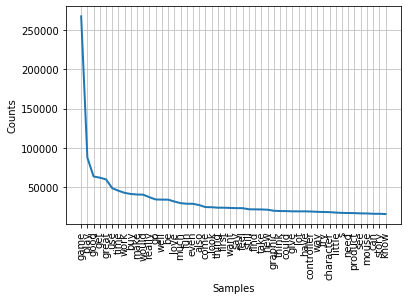

In [ ]:
freq = FreqDist(text)
tokenizer = RegexpTokenizer(r'\w+')
tokens = tokenizer.tokenize(text)
freq = FreqDist(tokens)
freq.plot(50)

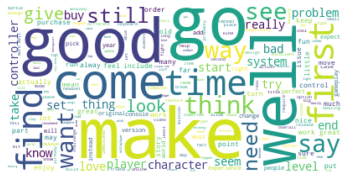

In [ ]:
# Create stopword list:
stopwords = set(STOPWORDS)
stopwords.update(["game", "use", "games", "play","even"])

# Generate a word cloud image
wordcloud = WordCloud(stopwords=stopwords, background_color="white").generate(text)

# Display the generated image:
# the matplotlib way:
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

### LDA

In [ ]:
# Create Dictionary
id2word = corpora.Dictionary(lemma_text_bigrams)

# Create Corpus
texts = lemma_text_bigrams

# Term Document Frequency
corpus = [id2word.doc2bow(text) for text in texts]

# View
print(corpus[:1])

[[(0, 1), (1, 1), (2, 1), (3, 1), (4, 1), (5, 1), (6, 1), (7, 1), (8, 1), (9, 1), (10, 1), (11, 1), (12, 1), (13, 2)]]


In [ ]:
perplexities = np.array([])
coherences = np.array([])
num_topics = np.array([5,10,15])

In [ ]:
# Calculate perplexity and coherence scores
for num in num_topics:
  lda_model = gensim.models.ldamodel.LdaModel(corpus=corpus,id2word=id2word,num_topics=num,random_state=100,update_every=1,chunksize=100,passes=10,alpha='auto',per_word_topics=True)
  perplexity = lda_model.log_perplexity(corpus)
  perplexities = np.append(perplexities, [perplexity])
  coherence_model_lda = CoherenceModel(model=lda_model, texts=lemma_text_bigrams, dictionary=id2word, coherence='c_v')
  coherence_lda = coherence_model_lda.get_coherence()
  coherences = np.append(coherences, [coherence_lda])
  print("number of topics:",num,", over")

number of topics: 5 , over
number of topics: 10 , over
number of topics: 15 , over


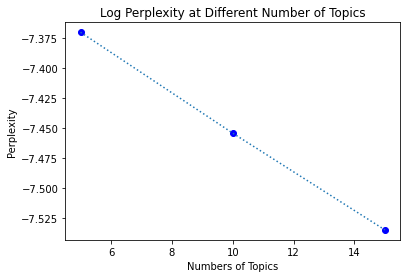

In [ ]:
x = num_topics
y = perplexities
plt.title('Log Perplexity at Different Number of Topics')
plt.xlabel('Numbers of Topics')
plt.ylabel('Perplexity')
plt.plot(x,y,"ob")
plt.plot(x,y,ls=":")
plt.show()

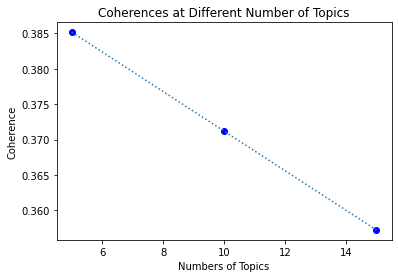

In [ ]:
x = num_topics
y = coherences
plt.title('Coherences at Different Number of Topics')
plt.xlabel('Numbers of Topics')
plt.ylabel('Coherence')
plt.plot(x,y,"ob")
plt.plot(x,y, ls = ':')
plt.show()

In [ ]:
# Visualize the topics
lda_model_5 = gensim.models.ldamodel.LdaModel(corpus=corpus,id2word=id2word,num_topics=5,random_state=100,update_every=1,chunksize=100,passes=10,alpha='auto',per_word_topics=True)
pyLDAvis.enable_notebook()
vis = plt_gensim.prepare(lda_model_5, corpus, id2word)
vis

/usr/local/lib/python3.7/dist-packages/pyLDAvis/_prepare.py:247: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  by='saliency', ascending=False).head(R).drop('saliency', 1)


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
3      0.191709 -0.136912       1        1  39.149999
4      0.233382 -0.139214       2        1  24.288612
1      0.089687  0.354445       3        1  17.234737
0     -0.292828 -0.134951       4        1  10.569770
2     -0.221949  0.056631       5        1   8.756881, topic_info=             Term           Freq          Total Category  logprob  loglift
5            game  261765.000000  261765.000000  Default  30.0000  30.0000
15           play   89846.000000   89846.000000  Default  29.0000  29.0000
62           work   44301.000000   44301.000000  Default  28.0000  28.0000
52          great   60196.000000   60196.000000  Default  27.0000  27.0000
126           use   46786.000000   46786.000000  Default  26.0000  26.0000
450          feel   23097.000000   23097.000000  Default  25.0000  25.0000
91            buy   41341.000000   41341.000000  Default  24.0000  24.0000
294     character   18524.000000   18524.000000  Default  23.0000  23.0000
330         level   16406.000000   16406.000000  Default  22.0000  22.0000
645        button   14571.000000   14571.000000  Default  21.0000  21.0000
441          take   21319.000000   21319.000000  Default  20.0000  20.0000
133             s   19283.000000   19283.000000  Default  19.0000  19.0000
63          would   44862.000000   44862.000000  Default  18.0000  18.0000
4             fun   29732.000000   29732.000000  Default  17.0000  17.0000
6            good   60819.000000   60819.000000  Default  16.0000  16.0000
10           time   44058.000000   44058.000000  Default  15.0000  15.0000
79             go   34765.000000   34765.000000  Default  14.0000  14.0000
456    controller   19365.000000   19365.000000  Default  13.0000  13.0000
101           get   59450.000000   59450.000000  Default  12.0000  12.0000
75             be   37341.000000   37341.000000  Default  11.0000  11.0000
374          will   14954.000000   14954.000000  Default  10.0000  10.0000
30           make   40978.000000   40978.000000  Default   9.0000   9.0000
44           also   28827.000000   28827.000000  Default   8.0000   8.0000
33        product   16655.000000   16655.000000  Default   7.0000   7.0000
74            way   18703.000000   18703.000000  Default   6.0000   6.0000
234           may   13395.000000   13395.000000  Default   5.0000   5.0000
144         price   15035.000000   15035.000000  Default   4.0000   4.0000
811         mouse   14911.000000   14911.000000  Default   3.0000   3.0000
189        really   38208.000000   38208.000000  Default   2.0000   2.0000
350          seem   13318.000000   13318.000000  Default   1.0000   1.0000
5            game  261765.031380  261765.843224   Topic1  -2.1705   0.9378
15           play   89845.803258   89846.614890   Topic1  -3.2399   0.9378
4             fun   29731.725884   29732.535338   Topic1  -4.3458   0.9377
205       graphic   20032.856009   20033.666341   Topic1  -4.7406   0.9377
193           lot   19017.348473   19018.163706   Topic1  -4.7926   0.9377
162         story   18642.761453   18643.573686   Topic1  -4.8125   0.9377
83         people   12693.224683   12694.040385   Topic1  -5.1969   0.9377
195          ever   11621.771347   11622.585457   Topic1  -5.2851   0.9377
94          enjoy   11323.417248   11324.226372   Topic1  -5.3111   0.9377
204      gameplay   10976.412723   10977.224855   Topic1  -5.3422   0.9377
945          mode   10256.308025   10257.123869   Topic1  -5.4101   0.9377
155           fan    8192.784744    8193.597655   Topic1  -5.6347   0.9377
171        online    7883.666496    7884.478134   Topic1  -5.6732   0.9377
55            kid    7118.096555    7118.907130   Topic1  -5.7753   0.9377
585          must    6902.027441    6902.842800   Topic1  -5.8062   0.9377
1140        video    6756.084175    6756.904022   Topic1  -5.8275   0.9376
185     challenge    6073.713010    6074.525157   Topi

## 5-star review

In [ ]:
five_star_reviews = df.loc[df['overall']==5].to_string_trigrams

In [ ]:
text_5star = " ".join(map(str, five_star_reviews))

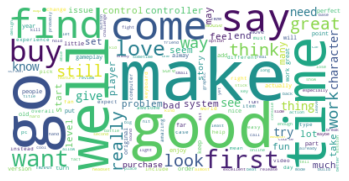

In [ ]:
# Generate a word cloud image
wordcloud = WordCloud(stopwords=stopwords, background_color="white").generate(text_5star)

# Display the generated image:
# the matplotlib way:
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

## 1-star review

In [ ]:
one_star_reviews = df.loc[df['overall']==1].to_string_trigrams
text_1star = " ".join(map(str, one_star_reviews))

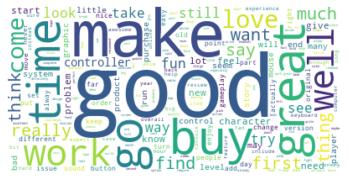

In [ ]:
# Generate a word cloud image
wordcloud = WordCloud(stopwords=stopwords, background_color="white").generate(text_1star)

# Display the generated image:
# the matplotlib way:
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

## 3-star and lower

In [ ]:
two_star_reviews = df.loc[df['overall']==2].to_string_trigrams
three_star_reviews = df.loc[df['overall']==3].to_string_trigrams
below_four = three_star_reviews.append(two_star_reviews).append(one_star_reviews)
text_below_4 = " ".join(map(str, below_four))

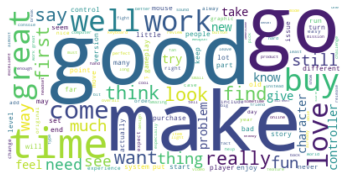

In [ ]:
# Generate a word cloud image
wordcloud = WordCloud(stopwords=stopwords, background_color="white").generate(text_below_4)

# Display the generated image:
# the matplotlib way:
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

## 4 and 5-star

In [ ]:
four_star_reviews = df.loc[df['overall']==4].to_string_trigrams
four_and_five = five_star_reviews.append(four_star_reviews)
text_above_4 = " ".join(map(str, four_star_reviews))

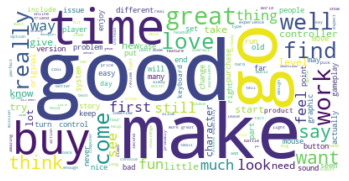

In [ ]:
# Generate a word cloud image
wordcloud = WordCloud(stopwords=stopwords, background_color="white").generate(text_above_4)

# Display the generated image:
# the matplotlib way:
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

## sentiment analysis

# Refer to 

https://github.com/melanieshi0120/NLP_Analysis_Amazon_Reviews/blob/master/Amazon_sport_product_review.ipynb

In [ ]:
# # bigrams before stopwords removal
# def get_top_n_bigram(corpus, n=None):
#     vec = CountVectorizer(ngram_range=(2, 2), stop_words='english').fit(corpus)
#     bag_of_words = vec.transform(corpus)
#     sum_words = bag_of_words.sum(axis=0) 
#     words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
#     words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
#     return words_freq[:n]

# common_words_good = get_top_n_bigram(df[df['target']==1]['combined_text'], 30)
# common_words_bad= get_top_n_bigram(df[df['target']==0]['combined_text'], 30)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


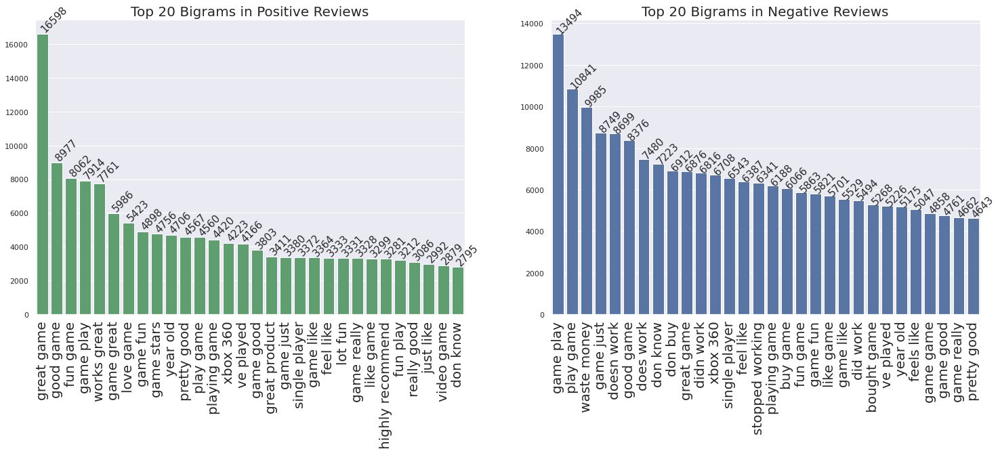

In [ ]:
# plt.figure(figsize=(25,8))
# # good reviews bigrams
# plt.subplot(1,2,1)
# x_good=[x[0] for x in common_words_good]
# y_good=[x[1] for x in common_words_good]
# sns.barplot(x_good,y_good,color='g')
# plt.xticks(rotation=90,fontsize=20)
# plt.title("Top 20 Bigrams in Positive Reviews",fontsize=20)
# for i in range(len(x_good)):
#     plt.text(i-0.2,y_good[i]+100,'{}'.format(y_good[i]),size=15,rotation=45)
    
# plt.subplot(1,2,2)
# x_bad=[x[0] for x in common_words_bad]
# y_bad=[x[1] for x in common_words_bad]
# sns.barplot(x_bad,y_bad,color='b')
# plt.xticks(rotation=90,fontsize=20)
# plt.title("Top 20 Bigrams in Negative Reviews",fontsize=20)
# for i in range(len(x_bad)):
#     plt.text(i-0.2,y_bad[i],'{}'.format(y_bad[i]),size=15,rotation=45)

In [ ]:
# # Combined grams
# def get_top_n_combinedgram(corpus, n=None):
#     vec = CountVectorizer(ngram_range=(1, 3)).fit(corpus)
#     bag_of_words = vec.transform(corpus)
#     sum_words = bag_of_words.sum(axis=0) 
#     words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
#     words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
#     return words_freq[:n]

# common_words_good_com = get_top_n_combinedgram(df[df['target']==1]['combined_text'], 30)
# common_words_bad_com= get_top_n_combinedgram(df[df['target']==0]['combined_text'], 30)

In [ ]:
# plt.figure(figsize=(25,8))
# # good reviews bigrams
# plt.subplot(1,2,1)
# x_good=[x[0] for x in common_words_good_com]
# y_good=[x[1] for x in common_words_good_com]
# sns.barplot(x_good,y_good,color='g')
# plt.xticks(rotation=90,fontsize=20)
# plt.title("Top 20 Bigrams in Positive Reviews",fontsize=20)
# for i in range(len(x_good)):
#     plt.text(i-0.2,y_good[i]+100,'{}'.format(y_good[i]),size=15,rotation=45)
    
# plt.subplot(1,2,2)
# x_bad=[x[0] for x in common_words_bad_com]
# y_bad=[x[1] for x in common_words_bad_com]
# sns.barplot(x_bad,y_bad,color='b')
# plt.xticks(rotation=90,fontsize=20)
# plt.title("Top 20 Bigrams in Negative Reviews",fontsize=20)
# for i in range(len(x_bad)):
#     plt.text(i-0.2,y_bad[i],'{}'.format(y_bad[i]),size=15,rotation=45)

## Data Preprocessing

In [ ]:
# delete special characters: a set of numbers prefixed by &# and suffixed by ;
import html

pattern = r"\&\#[0-9]+\;"
df["preprocessed_text"] = df["combined_text"].str.replace(pat=pattern, repl="", regex=True)

In [ ]:
%%time
import re
import string
import nltk

from nltk.stem.porter import PorterStemmer
porter_stemmer = PorterStemmer()

from nltk.stem import WordNetLemmatizer
wordnet_lemmatizer = WordNetLemmatizer()

from nltk import word_tokenize, pos_tag
from nltk.tokenize import sent_tokenize
from nltk.corpus import wordnet

nltk.download('stopwords')
nltk.download('punkt')
nltk.download('wordnet')
nltk.download('averaged_perceptron_tagger')
nltk.download('maxent_treebank_pos_tagger')

from unicodedata import normalize

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Unzipping corpora/wordnet.zip.
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Unzipping taggers/averaged_perceptron_tagger.zip.
[nltk_data] Downloading package maxent_treebank_pos_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Unzipping taggers/maxent_treebank_pos_tagger.zip.
CPU times: user 968 ms, sys: 244 ms, total: 1.21 s
Wall time: 1.58 s


In [ ]:
# reduce words to root form - using Lemmatization to reduce tokens to their base word
def lemmatize_word(tagged_token):
    """ Returns lemmatized word given its tag"""
    root = []
    for token in tagged_token:
        tag = token[1][0]
        word = token[0]
        if tag.startswith('J'):
            root.append(wordnet_lemmatizer.lemmatize(word, wordnet.ADJ))
        elif tag.startswith('V'):
            root.append(wordnet_lemmatizer.lemmatize(word, wordnet.VERB))
        elif tag.startswith('N'):
            root.append(wordnet_lemmatizer.lemmatize(word, wordnet.NOUN))
        elif tag.startswith('R'):
            root.append(wordnet_lemmatizer.lemmatize(word, wordnet.ADV))
        else:          
            root.append(word)
    return root

def lemmatize_doc(document):
    """ Tags words then returns sentence with lemmatized words"""
    lemmatized_list = []
    tokenized_sent = sent_tokenize(document)
    for sentence in tokenized_sent:
        no_punctuation = re.sub(r"[`'\",.!?()]", " ", sentence)
        tokenized_word = word_tokenize(no_punctuation)
        tagged_token = pos_tag(tokenized_word)
        lemmatized = lemmatize_word(tagged_token)
        lemmatized_list.extend(lemmatized)
    return " ".join(lemmatized_list)

In [ ]:
df["preprocessed_text"] = df["preprocessed_text"].apply(lambda row: lemmatize_doc(row))

In [ ]:
# remove accents: naive -> naive
remove_accent = lambda text: normalize("NFKD", text).encode("ascii", "ignore").decode("utf-8", "ignore")
df["accent_text"] = df["preprocessed_text"].apply(remove_accent)

In [ ]:
def tokenization(text):
    tokens = nltk.word_tokenize(text)
    return tokens

stopwords = nltk.corpus.stopwords.words('english')
stopwords += list(string.punctuation)
stopwords += ["''", '""', '...', '``', '’', '“', '’', '”', '‘', '‘',"'", '©',
'said',"'s", "also",'one',"n't",'com', 'satirewire', '-', '–', 
'—', '_','satirewire.com',"/"]
stopwords = set(stopwords)
def remove_stopwords(text):
    output= [i for i in text if i not in stopwords]
    return output

def stemming(text):
    stem_text = [porter_stemmer.stem(word) for word in text]
    return stem_text

def lemmatizer(text):
    lemm_text = [wordnet_lemmatizer.lemmatize(word) for word in text]
    return lemm_text

In [ ]:
df['clean_text']= df['accent_text'].apply(lambda x: x.lower())
print("lower the text, over")
df['clean_text']= df['clean_text'].apply(lambda x: tokenization(x))
print("tokenization step, over")
df['clean_text']= df['clean_text'].apply(lambda x:remove_stopwords(x))
print("stop word removal, over")
print("Completed")

lower the text, over
tokenization step, over
stop word removal, over
Completed


In [ ]:
# Phrase Modeling
tokenized = df['clean_text']

from gensim.models import Phrases
from gensim.models.phrases import Phraser
bi_gram = Phrases(tokenized, min_count=300, threshold=50)
tri_gram = Phrases(bi_gram[tokenized], min_count=300, threshold=50)

/usr/local/lib/python3.7/dist-packages/gensim/models/phrases.py:598: UserWarning: For a faster implementation, use the gensim.models.phrases.Phraser class
  warnings.warn("For a faster implementation, use the gensim.models.phrases.Phraser class")


In [ ]:
# unigram
uni_gram_tokens = set([token for text in tokenized for token in text])
uni_gram_tokens = set(filter(lambda x: x != "", uni_gram_tokens))

print(list(uni_gram_tokens)[:50])

['rx-480', 'requred', 'bad/last', 'work/directions', 'enviornments', 'majesco/zoe', 'stiles', 'lava-lake', 'ustanoven', 'jhp', 'cechk01', 'warrentee', '02/13/2014', 'unused/pointless', 'globule', 'narrating', 'coop-game', 'ideais', 'kri', 'start/restart', '45mb', '2gbvram', 'had/have', 'spaces', 'sub-woofers', 'experiences/life', 'limit-ness', 'oldish', 'wowhead', 'floors', '-consistent', 'tamagotchi', 'sidecar', 'zooming/moving', 'marquee', '10-in-1', 't-t-t', '/the-last-guy-online-game-code-full-game/dp/b002gp6wfe/ref=cm_cr_arp_d_rvw_txt', '*dull', 'non-realid', 'alota', 'haircolor', 'piece-by-piece', 'no-move', 'programmablity', 's-video/component', 'grenedier', 'weldon', 'itza', 'bmx']


In [ ]:
# bigram
bigram_min = bi_gram.min_count

bi_condition = lambda x: x[1] >= bigram_min

bi_gram_tokens = dict(filter(bi_condition, bi_gram.vocab.items()))
bi_gram_tokens = set([token.decode("utf-8") \
                      for token in bi_gram_tokens])

bi_grams_only = bi_gram_tokens.difference(uni_gram_tokens)
print(list(bi_grams_only)[:50])

['hard_earn', 'come_box', 'use_mic', 'due_fact', 'actually_quite', 'people_may', 'buy_headset', 'fell_apart', 'plug_play', 'time_finally', 'couple_hour', 'friend_say', 'controller_like', 'work_want', 'year_since', 'game_content', 'assassins_creed', 'battery_cover', 'say_look', 'company_make', 'give_five', 'character_customization', 'package_come', 'game_always', 'fix_game', 'gon_na', 'even_finish', 'need_something', 'ten_minute', 'something_else', 'mixed_bag', 'beta_test', 'game_realistic', 'wii_console', 'set_game', 'look_buy', 'get_run', 'enjoy_first', 'get_many', 'still_work', 'take_star', 'complete_game', 'go_get', '2_week', 'game_four', 'difficult_use', 'option_game', 'press_key', 'good_first', '100_time']


In [ ]:
# trigram
trigram_min = tri_gram.min_count

tri_condition = lambda x: x[1] >= trigram_min

tri_gram_tokens = dict(filter(tri_condition, tri_gram.vocab.items()))
tri_gram_tokens = set([token.decode("utf-8") \
                       for token in tri_gram_tokens])

tri_grams_only = tri_gram_tokens.difference(bi_gram_tokens)
print(list(tri_grams_only)[:50])

['call_duty_4', 'like_call_duty', 'modern_warfare_2', 'game_highly_recommend', 'product_five_stars', 'mass_effect_3', 'metal_gear_solid', 'expect_five_stars', 'waste_money_waste_money', 'super_smash_bros', 'highly_recommend_game', 'love_four_stars', 'name=_value=_http_//images-na', 'data-hook=_product-link-linked_class=_a-link-normal', 'good_five_stars', 'good_four_stars', 'resident_evil_game', 'rock_band_2', 'single_player_campaign', 'great_four_stars', 'new_3ds_xl', 'worth_every_penny', 'final_fantasy_game', '--_--_--_--', 'value=_http_//images-na_ssl-images-amazon', 'play_single_player', 'black_ops_2', '--_--_--', 'input_type=_hidden_name=', 'nancy_drew_game', 'video-url_input_type=_hidden', 'thanks_five_stars', 'go_back_forth', 'assassin_creed_game', 'star_wars_game', 'first_person_shooter', 'love_five_stars', 'work_windows_7', 'game_waste_money', 'like_four_stars', 'xbox_360_controller', 'waste_money_time', 'game_single_player', 'game_four_stars', 'final_fantasy_series', 'complete

In [ ]:
tokenized = [Phraser(tri_gram)[Phraser(bi_gram)[i]] for i in tokenized]

In [ ]:
tokenized = [list(filter(lambda x: len(x) > 1, document)) \
             for document in tokenized]

print(tokenized[3])

In [ ]:
# output dataset without bow or tfidf


In [ ]:
# create the vocabulary
from gensim.corpora.dictionary import Dictionary

vocabulary = Dictionary(tokenized)

vocabulary_keys = list(vocabulary.token2id)[0:10]

for key in vocabulary_keys:
    print(f"ID: {vocabulary.token2id[key]}, Token: {key}")

In [ ]:
# vectorizer text
# bags of words
bow = [vocabulary.doc2bow(doc) for doc in tokenized]

for idx, freq in bow[0]:
    print(f"Word: {vocabulary.get(idx)}, Frequency: {freq}")

In [ ]:
# tfidf
from gensim.models.tfidfmodel import TfidfModel

tfidf = TfidfModel(bow)

for idx, weight in tfidf[bow[0]]:
    print(f"Word: {vocabulary.get(idx)}, Weight: {weight:.3f}")

In [ ]:
# word embeddings
%%time
import numpy as np

from gensim.models import word2vec

np.set_printoptions(suppress=True)

feature_size = 100
context_size = 20
min_word = 1

word_vec= word2vec.Word2Vec(tokenized, size=feature_size, \
                            window=context_size, min_count=min_word, \
                            iter=50, seed=42)

In [ ]:
# final
word_vec_unpack = [(word, idx.index) for word, idx in \
                   word_vec.wv.vocab.items()]

tokens, indexes = zip(*word_vec_unpack)

word_vec_df = pd.DataFrame(word_vec.wv.syn0[indexes, :], index=tokens)

display(word_vec_df.head())

In [ ]:
%%time
tokenized_array = np.array(tokenized)

model_array = np.array([word_vec_df.loc[doc].mean(axis=0) for doc in tokenized_array])

In [ ]:
model_df = pd.DataFrame(model_array)
model_df["label"] = df["overall"]

display(model_df.head())

# LDA_new

In [ ]:
print(df['clean_text'][0])

['purchase', 'two', 'first', 'become', 'unresponsive', 'second', 'work', '15', 'second', 'push', 'joystick', 'direction', 'act', 'like', 'joystick', 'stick', 'run', '4', 'second', 'controller', 'pick', 'try', 'contact', 'mayflaah', 'customer', 'service', 'get', 'response', 'would', 'stay', 'away', 'get', 'driver', 'update', 'buy']


In [ ]:
# Build the bigram and trigram models
bigram = gensim.models.Phrases(df['clean_text'], min_count=5, threshold=20) # higher threshold fewer phrases.
trigram = gensim.models.Phrases(bigram[df['clean_text']], threshold=20)  

# Faster way to get a sentence clubbed as a trigram/bigram
bigram_mod = gensim.models.phrases.Phraser(bigram)
trigram_mod = gensim.models.phrases.Phraser(trigram)

In [ ]:
df['make_bigrams']= df['clean_text'].apply(lambda x:bigram_mod[x])
df['make_trigrams']= df['clean_text'].apply(lambda x:trigram_mod[bigram_mod[x]])

In [ ]:
clean_txt = df[df['target']==0]['make_bigrams'].tolist()
len(clean_txt) #299860

299860

In [ ]:
# bigram = gensim.models.Phrases(clean_txt, min_count=5, threshold=50) # higher threshold fewer phrases.
# trigram = gensim.models.Phrases(bigram[clean_txt], threshold=50) 

In [ ]:
# Faster way to get a sentence clubbed as a trigram/bigram
# bigram_mod = gensim.models.phrases.Phraser(bigram)
# trigram_mod = gensim.models.phrases.Phraser(trigram)

In [ ]:
# df['combine_text'] = df['clean_text'].apply(lambda row: trigram_mod[bigram_mod[row]])

In [ ]:
# clean_txt = df[df['target']==0]['clean_text'].tolist()
# len(clean_txt) #299860

In [ ]:
# See trigram example
# print(trigram_mod[bigram_mod[clean_txt[0]]])

['purchase', 'two', 'first', 'become', 'unresponsive', 'second', 'work', '15', 'second', 'push', 'joystick', 'direction', 'act', 'like', 'joystick', 'stick', 'run', '4', 'second', 'controller', 'pick', 'try', 'contact', 'mayflaah', 'customer_service', 'get', 'response', 'would', 'stay_away', 'get', 'driver', 'update', 'buy']


In [ ]:
# Create Dictionary
id2word = corpora.Dictionary(clean_txt)

# Create Corpus
texts = clean_txt

# Term Document Frequency
corpus = [id2word.doc2bow(text) for text in texts]

# View
print(corpus[:1])

[[(0, 1), (1, 1), (2, 1), (3, 1), (4, 1), (5, 1), (6, 1), (7, 1), (8, 1), (9, 1), (10, 1), (11, 2), (12, 2), (13, 1), (14, 1), (15, 1), (16, 1), (17, 1), (18, 1), (19, 1), (20, 3), (21, 1), (22, 1), (23, 1), (24, 1), (25, 1), (26, 1), (27, 1)]]


In [ ]:
# perplexities = np.array([])
# coherences = np.array([])
# num_topics = np.array([50,20,10])

In [ ]:
# Visualize the topics
lda_model_50 = gensim.models.ldamodel.LdaModel(corpus=corpus,id2word=id2word,num_topics=50,random_state=100,update_every=0,chunksize=10000,passes=10,alpha='auto',per_word_topics=True)
pyLDAvis.enable_notebook()
vis = plt_gensim.prepare(lda_model_50, corpus, id2word)
vis

/usr/local/lib/python3.7/dist-packages/pyLDAvis/_prepare.py:247: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  by='saliency', ascending=False).head(R).drop('saliency', 1)


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
11     0.032026 -0.057466       1        1  44.238764
28     0.012938 -0.152500       2        1   6.681200
30     0.022814 -0.097950       3        1   4.509980
41     0.135146  0.043068       4        1   4.222089
23     0.133318  0.021880       5        1   3.744532
33     0.126527  0.102261       6        1   3.282985
15     0.008071 -0.081593       7        1   2.790156
26     0.062439  0.018703       8        1   2.753440
0      0.097425  0.044329       9        1   2.559751
27     0.047765 -0.005597      10        1   2.335868
9      0.086884  0.054143      11        1   2.141694
44     0.069369 -0.012898      12        1   1.951567
43     0.048220 -0.019015      13        1   1.927619
49     0.000174 -0.103026      14        1   1.754223
40     0.061457  0.028741      15        1   1.550713
31     0.016259 -0.041416      16        1   1.379531
10     0.008464 -0.089812      17        1   1.353813
18     0.001836 -0.056665      18        1   1.326371
39     0.054410  0.026187      19        1   1.287200
45     0.008899 -0.006858      20        1   0.804288
20     0.046435  0.034643      21        1   0.696600
1      0.002286  0.037216      22        1   0.678177
12     0.005345  0.012253      23        1   0.599316
46    -0.001138  0.023216      24        1   0.535797
3      0.006389 -0.038767      25        1   0.532115
19    -0.005106  0.017129      26        1   0.502368
2      0.003027  0.125521      27        1   0.397552
25    -0.000455 -0.014782      28        1   0.357259
14    -0.039942  0.035042      29        1   0.330188
24    -0.022650 -0.040522      30        1   0.293581
42    -0.059394 -0.034590      31        1   0.287456
48     0.017370 -0.016713      32        1   0.268887
29    -0.027525 -0.034677      33        1   0.241055
47     0.010810 -0.014878      34        1   0.177690
8     -0.017941 -0.019724      35        1   0.161354
22    -0.043516 -0.041100      36        1   0.156585
21    -0.038764  0.049628      37        1   0.141020
37    -0.024105  0.034221      38        1   0.136874
16    -0.056331 -0.025249      39        1   0.135772
34    -0.122243  0.018669      40        1   0.111830
6     -0.044342  0.006698      41        1   0.103780
13    -0.028076 -0.012736      42        1   0.085877
32    -0.037192 -0.017771      43        1   0.084979
4     -0.023155  0.047290      44        1   0.083345
35    -0.097235  0.068839      45        1   0.069070
38    -0.083860  0.036111      46        1   0.063782
7     -0.063704  0.021716      47        1   0.052657
17    -0.081669  0.038219      48        1   0.046443
36    -0.145997  0.081384      49        1   0.038214
5     -0.061760  0.009198      50        1   0.034594, topic_info=                                                     Term           Freq  \
53                                                   game  504496.000000   
60                                                   play  163173.000000   
29                                                   work  148446.000000   
12                                                    get  177554.000000   
14                                                   like  132134.000000   
7                                              controller   73060.000000   
5                                                     buy  112174.000000   
100                                                  good  121650.000000   
168                                                   use  105026.000000   
137                                                  time   97861.000000   
447                                                 mouse   54212.000000   
111                                                  make   90042.000000   
30                                                  would   95256.000000   
54                                                     go   80179.000000   
149      

In [ ]:
# Visualize the topics
lda_model_10 = gensim.models.ldamodel.LdaModel(corpus=corpus,id2word=id2word,num_topics=10,random_state=100,update_every=0,chunksize=10000,passes=10,alpha='auto',per_word_topics=True)
pyLDAvis.enable_notebook()
vis = plt_gensim.prepare(lda_model_10, corpus, id2word)
vis

/usr/local/lib/python3.7/dist-packages/pyLDAvis/_prepare.py:247: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  by='saliency', ascending=False).head(R).drop('saliency', 1)


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
3     -0.096454 -0.000757       1        1  99.980147
0      0.001105  0.006923       2        1   0.003382
8     -0.024498 -0.000672       3        1   0.002502
9      0.012724 -0.017537       4        1   0.002299
6      0.002179 -0.002227       5        1   0.002292
1      0.032566  0.003313       6        1   0.002211
7      0.018889  0.007629       7        1   0.002157
5     -0.006153  0.007570       8        1   0.001908
4      0.017659 -0.004254       9        1   0.001661
2      0.041984  0.000013      10        1   0.001441, topic_info=                         Term           Freq          Total Category  logprob  \
53                       game  560833.000000  560833.000000  Default  30.0000   
12                        get  184148.000000  184148.000000  Default  29.0000   
60                       play  172944.000000  172944.000000  Default  28.0000   
14                       like  147523.000000  147523.000000  Default  27.0000   
29                       work  123366.000000  123366.000000  Default  26.0000   
100                      good  131610.000000  131610.000000  Default  25.0000   
137                      time  104152.000000  104152.000000  Default  24.0000   
5                         buy   96646.000000   96646.000000  Default  23.0000   
168                       use   95804.000000   95804.000000  Default  22.0000   
30                      would   93320.000000   93320.000000  Default  21.0000   
111                      make   93021.000000   93021.000000  Default  20.0000   
54                         go   81794.000000   81794.000000  Default  19.0000   
149                      even   71796.000000   71796.000000  Default  18.0000   
582                    really   75771.000000   75771.000000  Default  17.0000   
69                       well   64292.000000   64292.000000  Default  16.0000   
204                       bad   57228.000000   57228.000000  Default  15.0000   
602                     great   69011.000000   69011.000000  Default  14.0000   
11                      first   58265.000000   58265.000000  Default  13.0000   
210                      look   57702.000000   57702.000000  Default  12.0000   
7                  controller   54369.000000   54369.000000  Default  11.0000   
462                      much   63162.000000   63162.000000  Default  10.0000   
77                      thing   51847.000000   51847.000000  Default   9.0000   
25                        try   50607.000000   50607.000000  Default   8.0000   
40                          2   52860.000000   52860.000000  Default   7.0000   
181                       fun   58248.000000   58248.000000  Default   6.0000   
165                       say   52939.000000   52939.000000  Default   5.0000   
200                      want   52839.000000   52839.000000  Default   4.0000   
274                       new   48464.000000   48464.000000  Default   3.0000   
214                     think   48944.000000   48944.000000  Default   2.0000   
86                       come   47270.000000   47270.000000  Default   1.0000   
4799                    stars   27617.662282   27617.805307   Topic1  -6.3214   
1650                      meh    2947.930859    2948.004374   Topic1  -8.5587   
291                       ehh     336.750419     336.760430   Topic1 -10.7283   
1448                    works    3604.554588    3604.688212   Topic1  -8.3576   
12372                     3/5     624.715238     624.741598   Topic1 -10.1103   
4677                       eh    1231.670023    1231.726008   Topic1  -9.4315   
12941                      c+     175.522090     175.530126   Topic1 -11.3798   
619                     three   25674.930100   25676.170109   Topic1  -6.3943   
1261                  alright    2892.842119    2892.984924   Topic1  -8.5776   
3422                    so-so     572.903809     572.932175   Topic1 

In [ ]:
# Visualize the topics
lda_model_25 = gensim.models.ldamodel.LdaModel(corpus=corpus,id2word=id2word,num_topics=25,random_state=100,update_every=0,chunksize=10000,passes=10,alpha='auto',per_word_topics=True)
pyLDAvis.enable_notebook()
vis = plt_gensim.prepare(lda_model_25, corpus, id2word)
vis

/usr/local/lib/python3.7/dist-packages/pyLDAvis/_prepare.py:247: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  by='saliency', ascending=False).head(R).drop('saliency', 1)


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
11     0.136159 -0.012694       1        1  99.906223
22     0.017845  0.080393       2        1   0.036118
1     -0.038646 -0.002547       3        1   0.003656
3      0.047034  0.004117       4        1   0.003336
9     -0.013909 -0.010042       5        1   0.003313
15     0.048363 -0.008806       6        1   0.003229
24     0.024301  0.006654       7        1   0.003069
2     -0.047080 -0.011037       8        1   0.002998
7     -0.034104  0.000336       9        1   0.002901
8      0.019327 -0.003089      10        1   0.002894
17    -0.047665  0.000618      11        1   0.002787
18     0.031030 -0.006559      12        1   0.002785
4     -0.017435 -0.007893      13        1   0.002418
20     0.012660 -0.018710      14        1   0.002405
13     0.014170  0.000113      15        1   0.002230
23     0.004864 -0.007893      16        1   0.002171
12     0.004459 -0.007842      17        1   0.002105
10     0.000488  0.003325      18        1   0.002016
16    -0.000954  0.003675      19        1   0.001985
6     -0.007343  0.000419      20        1   0.001981
19    -0.038512  0.000703      21        1   0.001920
0     -0.008259 -0.001756      22        1   0.001915
5     -0.016221  0.001874      23        1   0.001896
21    -0.035673 -0.002852      24        1   0.001893
14    -0.054899 -0.000507      25        1   0.001755, topic_info=                                                     Term           Freq  \
53                                                   game  568133.000000   
12                                                    get  185646.000000   
60                                                   play  172640.000000   
14                                                   like  148080.000000   
29                                                   work  122471.000000   
100                                                  good  131696.000000   
137                                                  time  104460.000000   
5                                                     buy   96134.000000   
168                                                   use   95371.000000   
30                                                  would   93193.000000   
111                                                  make   92988.000000   
54                                                     go   81788.000000   
149                                                  even   72035.000000   
582                                                really   76512.000000   
602                                                 great   68827.000000   
69                                                   well   64353.000000   
462                                                  much   63240.000000   
204                                                   bad   57804.000000   
210                                                  look   57838.000000   
7                                              controller   54138.000000   
11                                                  first   58524.000000   
181                                                   fun   58772.000000   
40                                                      2   52755.000000   
165                                                   say   52501.000000   
25                                                    try   51036.000000   
200                                                  want   52624.000000   
77                                                  thing   52567.000000   
274                                                   new   48455.000000   
214                                                 think   49152.000000   
86                                                   come   47238.000000   
4799                                                stars   27663.595625   
1650                                                  meh    2953.3

In [ ]:
lda_model_3 = gensim.models.ldamodel.LdaModel(corpus=corpus,id2word=id2word,num_topics=3,random_state=100,update_every=0,chunksize=10000,passes=10,alpha='auto',per_word_topics=True)
pyLDAvis.enable_notebook()
vis = plt_gensim.prepare(lda_model_3, corpus, id2word)
vis

/usr/local/lib/python3.7/dist-packages/pyLDAvis/_prepare.py:247: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  by='saliency', ascending=False).head(R).drop('saliency', 1)


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
0     -0.005596  0.003354       1        1  61.136578
2     -0.001772 -0.004757       2        1  28.001333
1      0.007368  0.001403       3        1  10.862089, topic_info=                         Term           Freq          Total Category  logprob  \
47                       game  551445.000000  551445.000000  Default  30.0000   
11                        get  181019.000000  181019.000000  Default  29.0000   
53                       play  169147.000000  169147.000000  Default  28.0000   
26                       work  121163.000000  121163.000000  Default  27.0000   
93                       good  127892.000000  127892.000000  Default  26.0000   
189                       bad   56738.000000   56738.000000  Default  25.0000   
104                      make   90350.000000   90350.000000  Default  24.0000   
48                         go   79328.000000   79328.000000  Default  23.0000   
13                       like  145005.000000  145005.000000  Default  22.0000   
565                    really   74341.000000   74341.000000  Default  21.0000   
444                      much   61535.000000   61535.000000  Default  20.0000   
128                      time  102301.000000  102301.000000  Default  19.0000   
63                       well   62790.000000   62790.000000  Default  18.0000   
4                         buy   96579.000000   96579.000000  Default  17.0000   
23                        try   50475.000000   50475.000000  Default  16.0000   
185                      want   51663.000000   51663.000000  Default  15.0000   
976                      seem   33026.000000   33026.000000  Default  14.0000   
584                     great   67123.000000   67123.000000  Default  13.0000   
10                      first   56872.000000   56872.000000  Default  12.0000   
36                          2   51377.000000   51377.000000  Default  11.0000   
936                      feel   38648.000000   38648.000000  Default  10.0000   
119                       see   37054.000000   37054.000000  Default   9.0000   
309                      back   37816.000000   37816.000000  Default   8.0000   
833                    little   32179.000000   32179.000000  Default   7.0000   
158                       use   94817.000000   94817.000000  Default   6.0000   
27                      would   92407.000000   92407.000000  Default   5.0000   
285                     could   44654.000000   44654.000000  Default   4.0000   
206                       lot   32054.000000   32054.000000  Default   3.0000   
340                      need   36343.000000   36343.000000  Default   2.0000   
199                     think   48202.000000   48202.000000  Default   1.0000   
11474                  money-       7.749377       9.724773   Topic1 -13.9583   
36774              maul_death       4.575024       5.748914   Topic1 -14.4853   
4255    returning_immediately      10.074945      12.685310   Topic1 -13.6959   
41822                    recu       3.045141       3.845621   Topic1 -14.8924   
38385            lead_cadmium       5.315278       6.750184   Topic1 -14.3354   
28821          stearing_wheel       5.271953       6.717540   Topic1 -14.3436   
7528                  scalper      95.894184     122.288399   Topic1 -11.4427   
24773             marshmallow      17.045403      21.756638   Topic1 -13.1701   
20086                    1010       9.110118      11.641674   Topic1 -13.7966   
27675  worldwide_distributors      16.213723      20.722346   Topic1 -13.2201   
11507                   36_hr       3.730794       4.780877   Topic1 -14.6893   
27051                capslock      22.429568      28.756092   Topic1 -12.8956   
40676                re-taped       5.229100       6.708449   Topic1 -14.3517   
16075                 2000mah       7.527954       9.664394   Topic1 -13.9873   
17085         detachable_neck      11.4358

In [ ]:
clean_txt = df[df['target']==0]['make_trigrams'].tolist()
len(clean_txt) #299860

# Create Dictionary
id2word = corpora.Dictionary(clean_txt)

# Create Corpus
texts = clean_txt

# Term Document Frequency
corpus = [id2word.doc2bow(text) for text in texts]

# View
print(corpus[:1])

lda_model_3 = gensim.models.ldamodel.LdaModel(corpus=corpus,id2word=id2word,num_topics=3,random_state=100,update_every=0,chunksize=10000,passes=10,alpha='auto',per_word_topics=True)
pyLDAvis.enable_notebook()
vis = plt_gensim.prepare(lda_model_3, corpus, id2word)
vis

[[(0, 1), (1, 1), (2, 1), (3, 1), (4, 1), (5, 1), (6, 1), (7, 1), (8, 1), (9, 1), (10, 1), (11, 2), (12, 2), (13, 1), (14, 1), (15, 1), (16, 1), (17, 1), (18, 1), (19, 1), (20, 3), (21, 1), (22, 1), (23, 1), (24, 1), (25, 1), (26, 1), (27, 1)]]


/usr/local/lib/python3.7/dist-packages/pyLDAvis/_prepare.py:247: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  by='saliency', ascending=False).head(R).drop('saliency', 1)


PreparedData(topic_coordinates=              x    y  topics  cluster       Freq
topic                                           
0     -0.069653  0.0       1        1  73.078727
1     -0.056510  0.0       2        1  26.916945
2      0.126163  0.0       3        1   0.004328, topic_info=                                    Term           Freq          Total  \
47                                  game  555311.000000  555311.000000   
26                                  work  121031.000000  121031.000000   
4                                    buy   96456.000000   96456.000000   
53                                  play  169815.000000  169815.000000   
11                                   get  181415.000000  181415.000000   
93                                  good  128583.000000  128583.000000   
104                                 make   90839.000000   90839.000000   
140                                 even   72037.000000   72037.000000   
128                                 time  102676.000000  102676.000000   
13                                  like  145279.000000  145279.000000   
23                                   try   50661.000000   50661.000000   
27                                 would   92751.000000   92751.000000   
187                                  bad   57074.000000   57074.000000   
158                                  use   95214.000000   95214.000000   
48                                    go   79514.000000   79514.000000   
10                                 first   55601.000000   55601.000000   
6                             controller   53865.000000   53865.000000   
111                              product   38624.000000   38624.000000   
79                                  come   45867.000000   45867.000000   
63                                  well   63170.000000   63170.000000   
421                               button   32648.000000   32648.000000   
305                                 back   36879.000000   36879.000000   
282                                could   44791.000000   44791.000000   
184                                 want   51972.000000   51972.000000   
71                                 thing   51945.000000   51945.000000   
182                                 take   44708.000000   44708.000000   
252                                  new   44830.000000   44830.000000   
119                                  see   37274.000000   37274.000000   
396                              headset   24662.000000   24662.000000   
197                                think   48339.000000   48339.000000   
45217  lag_compensation_lag_compensation      34.175647      35.718546   
48612                     playstationeye      14.274172      15.423691   
8048                         teambuilder       7.775434       8.469901   
45847                       gator_crunch       5.791698       6.427550   
41987                        adult_ruine       6.688551       7.452480   
41986                         10x_markup       6.680142       7.458202   
59766                               tos2       6.491585       7.260577   
53597                         jigglypuff       7.094595       7.985849   
23404                        atmospheric     135.842204     153.739220   
25780                       prove_useful      15.299847      17.319710   
35503                          rf_switch      12.717835      14.411480   
52099                              -some      93.857734     106.516643   
26259                       wood_chipper       6.333095       7.192711   
13411                               bike     326.051335     370.362571   
40694                        importer520       3.306015       3.758417   
37959                              tyris      24.610783      28.001862   
20302                           tabletop      40.304353      45.913002   
12205                        translucent      35.562399      40.571156   
44269                               furu       6.544632       7.470311   
28430       

In [ ]:
clean_txt = df[df['target']==0]['clean_text'].tolist()
len(clean_txt) #299860

# Create Dictionary
id2word = corpora.Dictionary(clean_txt)

# Create Corpus
texts = clean_txt

# Term Document Frequency
corpus = [id2word.doc2bow(text) for text in texts]

# View
print(corpus[:1])

lda_model_3 = gensim.models.ldamodel.LdaModel(corpus=corpus,id2word=id2word,num_topics=3,random_state=100,update_every=0,chunksize=10000,passes=10,alpha='auto',per_word_topics=True)
pyLDAvis.enable_notebook()
vis = plt_gensim.prepare(lda_model_3, corpus, id2word)
vis

[[(0, 1), (1, 1), (2, 1), (3, 1), (4, 1), (5, 1), (6, 1), (7, 1), (8, 1), (9, 1), (10, 1), (11, 1), (12, 2), (13, 2), (14, 1), (15, 1), (16, 1), (17, 1), (18, 1), (19, 1), (20, 1), (21, 3), (22, 1), (23, 1), (24, 1), (25, 1), (26, 1), (27, 1), (28, 1), (29, 1), (30, 1)]]


/usr/local/lib/python3.7/dist-packages/pyLDAvis/_prepare.py:247: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  by='saliency', ascending=False).head(R).drop('saliency', 1)


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
2      0.001109 -0.004445       1        1  43.393732
0     -0.004549  0.001296       2        1  33.879198
1      0.003440  0.003148       3        1  22.727070, topic_info=                    Term           Freq          Total Category  logprob  \
53                  game  551481.000000  551481.000000  Default  30.0000   
5                    buy   96265.000000   96265.000000  Default  29.0000   
12                   get  181520.000000  181520.000000  Default  28.0000   
30                 would   91944.000000   91944.000000  Default  27.0000   
168                  use   94397.000000   94397.000000  Default  26.0000   
111                 make   91781.000000   91781.000000  Default  25.0000   
149                 even   71689.000000   71689.000000  Default  24.0000   
69                  well   62938.000000   62938.000000  Default  23.0000   
29                  work  122508.000000  122508.000000  Default  22.0000   
25                   try   50553.000000   50553.000000  Default  21.0000   
127                  see   37094.000000   37094.000000  Default  20.0000   
210                 look   56989.000000   56989.000000  Default  19.0000   
274                  new   47966.000000   47966.000000  Default  18.0000   
137                 time  102768.000000  102768.000000  Default  17.0000   
40                     2   52341.000000   52341.000000  Default  16.0000   
181                  fun   56900.000000   56900.000000  Default  15.0000   
715                level   32309.000000   32309.000000  Default  14.0000   
1288                 wii   18736.000000   18736.000000  Default  13.0000   
214                think   48231.000000   48231.000000  Default  12.0000   
327                 back   42295.000000   42295.000000  Default  11.0000   
119              product   38662.000000   38662.000000  Default  10.0000   
20                   run   27594.000000   27594.000000  Default   9.0000   
86                  come   46571.000000   46571.000000  Default   8.0000   
204                  bad   57135.000000   57135.000000  Default   7.0000   
293                 give   43496.000000   43496.000000  Default   6.0000   
268              graphic   36265.000000   36265.000000  Default   5.0000   
56                  love   27672.000000   27672.000000  Default   4.0000   
14                  like  144640.000000  144640.000000  Default   3.0000   
1441              pretty   32489.000000   32489.000000  Default   2.0000   
358                 need   36504.000000   36504.000000  Default   1.0000   
17549             pluged       4.424246       5.688439   Topic1 -14.2258   
19315             corapt       2.165781       2.903533   Topic1 -14.9402   
19807        confliction       2.794811       3.778014   Topic1 -14.6852   
6704               frien       2.033526       2.879318   Topic1 -15.0032   
1553     belt/controller       2.659173       3.766139   Topic1 -14.7349   
28570               mest       3.313023       4.696614   Topic1 -14.5151   
5309          homophobic       3.293302       4.704962   Topic1 -14.5211   
32037            xlgames       3.290276       4.708307   Topic1 -14.5220   
23764           superamp       3.857988       5.653774   Topic1 -14.3628   
13338             biught       3.192925       4.680196   Topic1 -14.5520   
18446           vendedor       6.551391       9.603970   Topic1 -13.8333   
45477       anime-styled       2.525899       3.742573   Topic1 -14.7863   
22441                 gu       3.802499       5.636854   Topic1 -14.3773   
19690             wronge       1.919854       2.856234   Topic1 -15.0607   
4154             invalid     288.184199     429.966242   Topic1 -10.0493   
37539           humongus       1.914002       2.856052   Topic1 -15.0637   
35206              gator       9.034458      13.564666   Topic1 -13.5119   
21721              shiat       1.893400